# Exploratory Data Analysis

### Imports

In [2]:
import numpy as np
import pandas as pd
import plotly.express as px
from pandas_profiling import ProfileReport

### Parameters

In [3]:
target_col = "price"

## Load train dataset

In [5]:
df_train = pd.read_feather("../../data/processed/train.feather")
print(df_train.shape)

(72241, 49)


## Additional processing

To understand how geohash delimiter it's better to final model, we'll generate features for each geohash delimiter.

See more about geohash in **docs/geohash.md**

In [6]:
geohashs_delimiters = [3, 4, 5, 6]

for i in geohashs_delimiters:
    key = "geohash_{}".format(i)
    df_train[key] = [str(g)[:i] for g in df_train["geohash"]]

In [7]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72241 entries, 0 to 72240
Data columns (total 53 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             72241 non-null  object 
 1   usableAreas                    72231 non-null  float64
 2   parkingSpaces                  71019 non-null  float64
 3   suites                         66274 non-null  float64
 4   bathrooms                      72240 non-null  float64
 5   totalAreas                     43864 non-null  float64
 6   bedrooms                       72241 non-null  int64  
 7   publicationType                72241 non-null  object 
 8   geohash                        72231 non-null  object 
 9   price                          72241 non-null  int64  
 10  businessType                   72241 non-null  object 
 11  yearlyIptu                     62236 non-null  float64
 12  monthlyCondoFee                68461 non-null 

In [8]:
fig = px.histogram(df_train, x=target_col, nbins=50,
                   color="businessType", title="Distribution of businessType")
fig.show()

In [9]:
# Filter only SALE
df_eda = df_train[df_train["businessType"] == "SALE"].copy()
print(df_eda.shape)

(64146, 53)


In [11]:
fig = px.histogram(df_eda, x=target_col, nbins=50,
                   color="has_pool", title="Distribution of has_pool")
fig.show()

## Porcentagens de ricos no bairro

Usando os dados do IBGE, vamos calcular a porcentagem de ricos no bairro.

In [12]:
lower_salary = ["renda_nom_dom_sal_baixo1", "renda_nom_dom_sal_baixo2",
                "renda_nom_dom_sal_baixo3", "renda_nom_dom_sal_baixo4",
               "renda_nom_dom_sal_medio1", "renda_nom_dom_sal_medio2",
               "renda_nom_dom_sal_medio3"]

higher_salary = ["renda_nom_dom_sal_alto1", "renda_nom_dom_sal_alto2"]

all_salary = lower_salary + higher_salary

def sum_columns(df, columns):
    result = np.zeros(len(df))
    for col in columns:
        result = result + df[col].values
    return result

df_eda["wealthy_salary_count"] = sum_columns(df_eda, higher_salary)
df_eda["wealthy_salary_rate"] = df_eda["wealthy_salary_count"] / sum_columns(df_eda, all_salary)
df_eda["wealthy_rate_neighborhood"] = [False if e <= 0.5 else True for e in df_eda["wealthy_salary_rate"].tolist()]
df_eda["wealthy_rate_neighborhood"] = pd.qcut(df_eda['wealthy_salary_rate'], q=5)

In [13]:
new_cols = ["wealthy_salary_count", "wealthy_salary_rate", "wealthy_rate_neighborhood"]

df_eda[all_salary+new_cols]

,renda_nom_dom_sal_baixo1,renda_nom_dom_sal_baixo2,renda_nom_dom_sal_baixo3,renda_nom_dom_sal_baixo4,renda_nom_dom_sal_medio1,renda_nom_dom_sal_medio2,renda_nom_dom_sal_medio3,renda_nom_dom_sal_alto1,renda_nom_dom_sal_alto2,wealthy_salary_count,wealthy_salary_rate,wealthy_rate_neighborhood
0,0.0,0.0,1.0,4.0,17.0,18.0,39.0,87.0,83.0,170.0,0.682731,"(0.667, 1.0]"
1,5.0,0.0,1.0,4.0,11.0,12.0,21.0,81.0,150.0,231.0,0.810526,"(0.667, 1.0]"
2,0.0,0.0,0.0,7.0,5.0,14.0,26.0,51.0,43.0,94.0,0.643836,"(0.474, 0.667]"
3,2.0,3.0,19.0,58.0,73.0,20.0,20.0,15.0,5.0,20.0,0.093023,"(-0.001, 0.11]"
4,1.0,0.0,4.0,12.0,7.0,6.0,13.0,36.0,36.0,72.0,0.626087,"(0.474, 0.667]"
...,...,...,...,...,...,...,...,...,...,...,...,...
72236,0.0,0.0,0.0,5.0,14.0,14.0,21.0,6.0,0.0,6.0,0.100000,"(-0.001, 0.11]"
72237,0.0,0.0,2.0,15.0,36.0,34.0,39.0,86.0,63.0,149.0,0.541818,"(0.474, 0.667]"
72238,1.0,0.0,2.0,17.0,27.0,26.0,31.0,23.0,3.0,26.0,0.200000,"(0.11, 0.267]"
72239,1.0,4.0,28.0,79.0,85.0,17.0,3.0,1.0,1.0,2.0,0.009132,"(-0.001, 0.11]"


In [14]:
fig = px.histogram(df_eda.dropna(subset=["wealthy_rate_neighborhood"]),
                   x=target_col, nbins=50, color="wealthy_rate_neighborhood",
                   title="Distribution of wealthy_rate_neighborhood")
fig.show()

In [15]:
df_eda["usableAreas_bins"] = pd.qcut(df_eda['usableAreas'], q=4)

In [16]:
fig = px.histogram(df_eda.dropna(subset=["usableAreas_bins"]), x=target_col,
                   nbins=50, color="usableAreas_bins", title="Distribution of usableAreas")
fig.show()

## Pandas Profiling

In [17]:
# Creating features discovered in EDA

df_train["wealthy_salary_count"] = sum_columns(df_train, higher_salary)
df_train["wealthy_salary_rate"] = df_train["wealthy_salary_count"] / sum_columns(df_train, all_salary)
df_train["wealthy_rate_neighborhood"] = pd.qcut(df_train['wealthy_salary_rate'], q=5)
df_train["wealthy_rate_neighborhood"] = df_train["wealthy_rate_neighborhood"].astype(str)

df_train["usableAreas_bins"] = pd.qcut(df_eda['usableAreas'], q=4)
df_train["usableAreas_bins"] = df_train["usableAreas_bins"].astype(str)

In [18]:
profile = ProfileReport(df_train, title="ds-zap-challenge - Train dataset", minimal=True)
profile.to_file("report_training.html")

Summarize dataset:   0%|          | 0/65 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Features selection

Based on `report_training_set.html` provided by Pandas Profiling, I'll check what features will be used to modeling.

### Geohash analysis

As almost all items are from the São Paulo city, using a smaller geohash delimiter will help to group properties in nearby neighborhoods. The list of IBGE variables will help understand the property's price.

Then, I decided to proceed only with `geohash_5` and `geohash_6` to modeling. In the sequence, I'll check the features importantes for modeling.

### Invalid features

- has_elevator (only 1 row with `True`)
- rural_urbano (100% missing)
- geohash_4 (excluded by Geohash's analysis)
- geohash_3 (excluded by Geohash's analysis)
- geohash (excluded by Geohash's analysis)

### Approved features wiith missing values

- usableAreas (< 0.1%)
- parkingSpaces (1,7%)
- suites (8,3%)
- bathrooms (< 0.1%)
- totalAreas (39,3%)
- geohash (< 0.1%)
- yearlyIptu (13,8%)
- monthlyCondoFee (5.2%)
- total_dom_part_improvisados (0.6%) - `Zeros (%): 91,2%`
- renda_nom_dom_part(0.6%)
- renda_nom_dom_part_perm (0.6%)
- renda_nom_dom_part_imp (0.6%) - `Zeros (%): 91,6%`
- renda_nom_dom_sal_baixo1 (0.6%) - `Zeros (%): 80.6%`
- renda_nom_dom_sal_baixo2 (0.6%)
- renda_nom_dom_sal_baixo3 (0.6%)
- renda_nom_dom_sal_baixo4 (0.6%)
- renda_nom_dom_sal_medio1 (0.6%)
- renda_nom_dom_sal_medio2 (0.6%)
- renda_nom_dom_sal_medio3 (0.6%)
- renda_nom_dom_sal_alto1 (0.6%)
- renda_nom_dom_sal_alto2 (0.6%)
- renda_nom_dom_sem_rendimento (0.6%)
- ident_logradouro_proprios (0.6%)
- nao_ident_logradouro_proprios (0.6%) - `Zeros (%): 85.8%`
- ident_logradouro_alugados (0.6%)
- nao_ident_logradouro_alugados (0.6%) - `Zeros (%): 88.2%`
- ilum_publica_proprios (0.6%)
- nao_ilum_publica_proprios (0.6%) - `Zeros (%): 93.9%`
- ilum_publica_alugados (0.6%)
- nao_ilum_publica_alugados (0.6%) - `Zeros (%): 95.3%`

## Features with too many zero values

In [19]:
zero_cols = ["total_dom_part_improvisados", "renda_nom_dom_part_imp", "renda_nom_dom_sal_baixo1",
             "nao_ident_logradouro_proprios", "nao_ident_logradouro_alugados", "nao_ilum_publica_proprios",
             "nao_ilum_publica_alugados"]

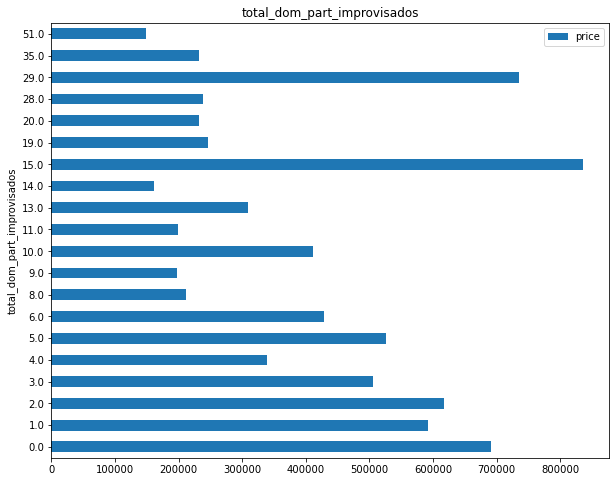

In [20]:
col = "total_dom_part_improvisados"

df_train[[col, target_col]].groupby(col).mean().plot(kind="barh", figsize=(10, 8), title=col);

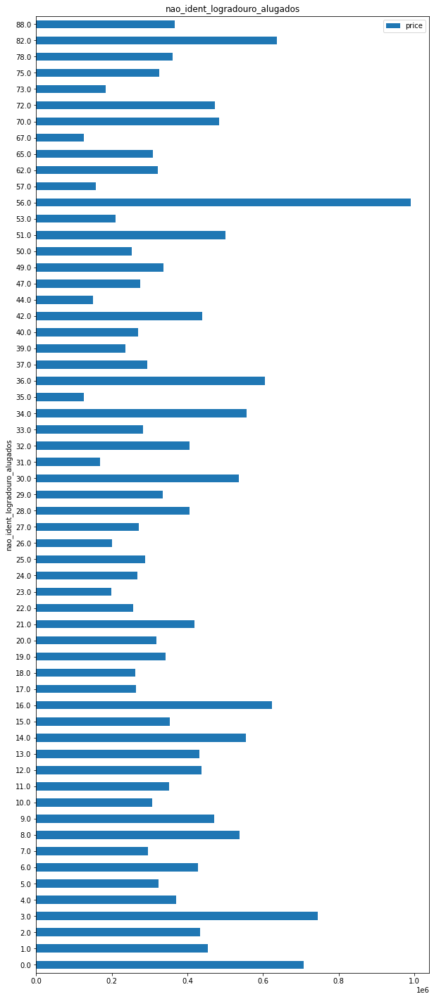

In [21]:
col = "nao_ident_logradouro_alugados"

df_train[[col, target_col]].groupby(col).mean().plot(kind="barh", figsize=(10, 25), title=col);

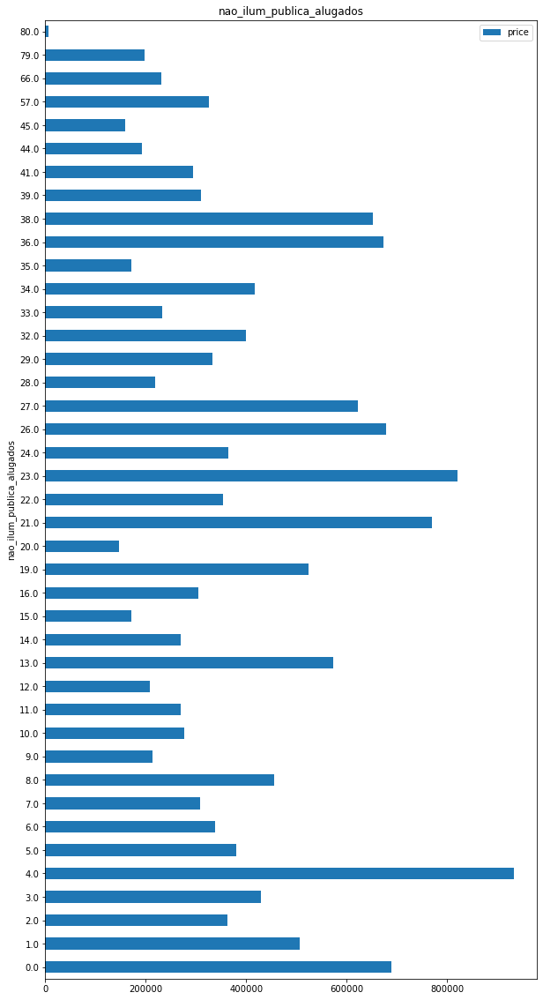

In [22]:
col = "nao_ilum_publica_alugados"

df_train[[col, target_col]].groupby(col).mean().plot(kind="barh", figsize=(10, 20), title=col);

## Feature importance

In [23]:
invalid_cols = ["id", "has_elevator", "rural_urbano", "geohash_4", "geohash_3", "geohash"]

In [24]:
X = prep_modeling(df_train, invalid_cols)

NameError: name 'prep_modeling' is not defined

In [ ]:
y = X[target_col].values
X = X.drop(columns=[target_col]+all_salary, errors="ignore")

In [25]:
model = RandomForestRegressor()
model.fit(X, y)

importance = model.feature_importances_
features = X.columns.tolist()

NameError: name 'RandomForestRegressor' is not defined

In [ ]:
feature_importance = pd.DataFrame({"importance": importance}, index=features)
feature_importance.sort_values(by="importance", ascending=False)

The graph below was developed with JavaScript, if you can't see it here, you can have an image on **docs/images/feature_importance.png**

In [ ]:
px.bar(feature_importance.sort_values(by="importance"),
       x="importance", title="Feature importance", orientation='h', height=1024)

## Target feature stats

In [ ]:
y_stats = pd.DataFrame(y).describe()
y_stats.columns = ["stats"]
y_stats["stats"] = y_stats["stats"].astype(int)
y_stats

The graph below was developed with JavaScript, if you can't see it here, you can have an image on **docs/images/price_variance.png**

In [ ]:
px.histogram(pd.DataFrame(y, columns=["price"]), nbins=500)

## Conclusions

We have a lot of features that isn't most importante to the modeling,probably, we need to go back to processing and spend more time adjusting the features of the "Description" and the 2010 IBGE Census Data.

About **geohash** we saw that `geohash_5` got a higher importance than `geohash_6`. Perhaps we'll exclude `geohash_6` on the modeling step.